# UP 206A Final: Nathan Keibler and Bryan Graveline - Part 3

This document series contains our group's code from Group Assignment 3, Group Assignment 4, and new code created for the final project. Section 2 sets up the data sources using mostly code from Group Assignment 3. Section 3 includes the spatial join to connect our two datasets and some inital mapping of the joined geodataframe. Section 4 contains the spatial autocorrelation analysis. Lastly, Section 5 contains a scatter plot and side-by-side map relating neighborhood income to ADUs permitted per capita.

This specific document (Part 3) contains Sections 4 and 5 as well as data and analysis from Sections 2 and 3 necessary to inform Sections 4 and 5.

# Data and Analysis from Section 2 to Inform Sections 4 and 5

In [55]:
# to read and wrangle data
import pandas as pd
import numpy as np

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [56]:
df = gpd.read_file('data/Building_and_Safety_Permit_Information_Old_cleaned.csv')

In [57]:
gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.Longitude, df.Latitude))

In [58]:
gdf_2 = gpd.read_file('data/acs2019_5yr_B19013_14000US06037185320.geojson')

In [59]:
gdf_2 = gdf_2.drop([1004])

In [60]:
gdf_2.columns = ['geoid','name','median income','error','geometry']

In [61]:
gdf_3 = gpd.read_file('data/acs2019_5yr_B01003_14000US06037208802.geojson')

In [62]:
gdf_3 = gdf_3.drop([1004])

In [63]:
gdf_3.columns = ['geoid','name','population','poperror','geometry']

In [64]:
gdf_2 = pd.merge(gdf_2, gdf_3, on=['geoid','name','geometry'])

In [65]:
gdf.set_crs(epsg=4326, inplace=True)

,Assessor Book,Assessor Page,Assessor Parcel,Tract,Block,Lot,Reference # (Old Permit #),PCIS Permit #,Status,Status Date,...,Zone,Occupancy,Floor Area-L.A. Building Code Definition,Census Tract,Council District,Latitude,Longitude,Existing Code,Proposed Code,geometry
0,5069,2,15,TR 4713,,43,20WL05816,19014-10000-05185,Issued,3/10/2020,...,R1R3-RG-O,,115,2169,10,34.04739,-118.36467,7,1,POINT (-118.36467 34.04739)
1,2276,18,28,TR 5822,,316,19VN04144,19016-20001-12927,Permit Finaled,10/28/2020,...,RE11-1,,0,1413.04,4,34.14947,-118.4565,1,1,POINT (-118.45650 34.14947)
2,2226,14,6,TR 20444,,6,20ON 1930,20016-10000-19416,Issued,10/27/2020,...,R1-1,,0,1321.02,6,34.20732,-118.49688,1,1,POINT (-118.49688 34.20732)
3,2637,1,20,TR 14616,,87,19VN92737,19016-20000-10523,CofO Issued,10/31/2020,...,R1-1,,0,1199,6,34.2294,-118.43923,1,1,POINT (-118.43923 34.22940)
4,5053,24,32,CHA'S VICTOR HALL TRACT,26,21,20ON 1938,20010-10000-02259,Issued,10/27/2020,...,R1R3-O-CPIO,,438,2221,8,34.02655,-118.30291,,1,POINT (-118.30291 34.02655)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8663,6031,31,11,SUNSET SQUARE,,20,19SL68122,19010-10000-00417,Issued,10/21/2019,...,R2-1,,"1,088",2397.01,9,33.9649,-118.27552,,1,POINT (-118.27552 33.96490)
8664,2346,20,2,TR 11715,,2,19VN01880,19016-20000-04281,Issued,8/22/2019,...,R1-1,,0,1240,2,34.16792,-118.40928,1,1,POINT (-118.40928 34.16792)
8665,2167,11,6,TR 6170,O,2608,19VN92782,18010-20000-04034,CofO Issued,11/23/2020,...,R1-1,,"1,150",1375.02,3,34.15856,-118.59564,,1,POINT (-118.59564 34.15856)
8666,2336,36,35,TR 5847,A,48,20VN19507,20014-20000-01584,Issued,10/28/2020,...,R1-1,,87,1242.01,2,34.18136,-118.37113,7,1,POINT (-118.37113 34.18136)


In [66]:
gdf_web_mercator = gdf.to_crs(epsg=3857)

# Data and Analysis from Section 3 to Inform Sections 4 and 5

In [67]:
# Do the spatial join
gdf = gdf.to_crs(epsg=4326)
join = gpd.sjoin(gdf, gdf_2, how='left')
join.head()

,Assessor Book,Assessor Page,Assessor Parcel,Tract,Block,Lot,Reference # (Old Permit #),PCIS Permit #,Status,Status Date,...,Existing Code,Proposed Code,geometry,index_right,geoid,name,median income,error,population,poperror
0,5069,2,15,TR 4713,,43,20WL05816,19014-10000-05185,Issued,3/10/2020,...,7,1,POINT (-118.36467 34.04739),642,14000US06037216900,"Census Tract 2169, Los Angeles, CA",89547.0,20184.0,4886.0,343.0
1,2276,18,28,TR 5822,,316,19VN04144,19016-20001-12927,Permit Finaled,10/28/2020,...,1,1,POINT (-118.45650 34.14947),336,14000US06037141304,"Census Tract 1413.04, Los Angeles, CA",98375.0,9629.0,2995.0,271.0
2,2226,14,6,TR 20444,,6,20ON 1930,20016-10000-19416,Issued,10/27/2020,...,1,1,POINT (-118.49688 34.20732),262,14000US06037132102,"Census Tract 1321.02, Los Angeles, CA",49838.0,12253.0,5401.0,485.0
3,2637,1,20,TR 14616,,87,19VN92737,19016-20000-10523,CofO Issued,10/31/2020,...,1,1,POINT (-118.43923 34.22940),139,14000US06037119900,"Census Tract 1199, Los Angeles, CA",78000.0,14084.0,5245.0,401.0
4,5053,24,32,CHA'S VICTOR HALL TRACT,26,21,20ON 1938,20010-10000-02259,Issued,10/27/2020,...,,1,POINT (-118.30291 34.02655),687,14000US06037222100,"Census Tract 2221, Los Angeles, CA",53864.0,12608.0,4331.0,488.0


In [68]:
#combining arguments (can be split up) to use joined gdf and using the FIPS code to get a count - resetting to get index
permits_by_tract = join.geoid.value_counts().rename_axis('geoid').reset_index(name='permits_count')

In [69]:
# join the summary table back to the gdf
# merge permits on gdf by census tract
gdf_2=gdf_2.merge(permits_by_tract,on='geoid')

In [70]:
gdf_2['permits_per_1000'] = gdf_2['permits_count']/gdf_2['population']*1000

# Spatial Autocorrelation (From Group Assignment 4)

Now that we have connected our two datasets spatially and mapped them to show the location of permits per 1000 people by census tracts, we see that there are spatial clusters appearing primarily in the San Fernando Valley. However, we can't really back this up with statistical certainty. It's unclear if this pattern is a matter of chance. To evaluate this, we will conduct spatial autocorrelation, a process to determine to what degree an existing pattern is or is not random. We'll use the Global Moran's I statistic to help us quantify the degree to which similar geographies are clustered. 

Our tasks for this section are as follows:

- Find tendencies for spatial clustering in your data by conducting a spatial autocorrelation analysis. Our results will include a global Moran's I statistic, followed by a local spatial autocorrelation with a Moran's plot that indicates a P-value and a scatterplot with HH, HL, LH, and LL values. 
- Produce a final output in the form of a map that indicates the location of statistically significant spatial clusters.

Below, we'll walk through the steps from the spatial autocorrelation lab to accomplish these goals.

## Spatial Weights

The map directly above shows each census tract's permitted ADUs. However, we're interested to compare each tract's permitted ADUs to its neighbors. To do this, we assign spatial weights to each tract. Similar to the Week 8 lab, we'll do this using the KNN weight, where k is the number of "nearest neighbors" to count in the calculations. We'll look at the 8 nearest neighbors. 

In [71]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(gdf_2,k=8)

# Row-standardization
wq.transform = 'r'

## Spatial Lag

Next, we use those row-standardized weights to calculate the spatial lag. The spatial lag is a single number per census tract that is calculated by taking the average of its 8 nearest neighbors' spatial weights. This takes into account the values from each census tract's neighbors, taking the value from each neighbor, based on spatial weight, to get a single associated lag value. We'll place this spatial lag value in a new column.

In [72]:
gdf_2['permits_per_1000_lag'] = lps.weights.lag_spatial(wq, gdf_2['permits_per_1000'])

In [73]:
gdf_2.sample(10)[['population','permits_count','permits_per_1000','permits_per_1000_lag']]

,population,permits_count,permits_per_1000,permits_per_1000_lag
468,3286.0,2,0.608643,0.670272
792,4382.0,4,0.912825,0.302644
622,4088.0,5,1.223092,4.667179
578,5505.0,8,1.453224,0.581170
346,6070.0,14,2.306425,2.421632
320,3811.0,6,1.574390,1.925135
296,3998.0,1,0.250125,4.303714
60,3099.0,2,0.645369,4.250640
410,3703.0,2,0.540103,0.386360
571,3194.0,8,2.504696,1.278946


We can now compare "permits_per_1000" to "permits_per_1000_lag". When the former value is higher, the census tract is closer to being a "diamond" - more permits than its neighbors. When the latter value is higher, it's closer to a "donut" - less permits than its neighbors.

For example, in row 522, we see that this census tract's permit per 1000 value is higher than its permit per 1000 lag value. This means that this tract is likely a diamond as its normalized permit count is higher than the average of its 8 nearest neighbors. 

## The Donut and the Diamond

Here, we want to identify census tracts that are the most "donuty" and the most "diamondy", per the description in the markdown cell above. We start by calculating the difference between permits_per_1000 and permits_per_1000_lag for each row. We then find the donut and the diamond and map them.

In [74]:
gdf_2['permit_lag_diff'] = gdf_2['permits_per_1000'] - gdf_2['permits_per_1000_lag']

In [75]:
gdf_2.sort_values(by='permit_lag_diff')

,geoid,name,median income,error,geometry,population,poperror,permits_count,permits_per_1000,permits_per_1000_lag,permit_lag_diff
365,14000US06037188100,"Census Tract 1881, Los Angeles, CA",62500.0,14197.0,"MULTIPOLYGON (((-118.27834 34.15320, -118.2776...",3918.0,440.0,18,4.594181,28.327696,-23.733515
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,9483.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",6347.0,484.0,2,0.315110,9.425765,-9.110656
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,4639.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",3702.0,276.0,12,3.241491,9.059968,-5.818477
151,14000US06037122122,"Census Tract 1221.22, Los Angeles, CA",41811.0,6104.0,"MULTIPOLYGON (((-118.37948 34.22330, -118.3774...",2728.0,282.0,3,1.099707,6.355258,-5.255552
286,14000US06037137501,"Census Tract 1375.01, Los Angeles, CA",92156.0,15693.0,"MULTIPOLYGON (((-118.58837 34.16640, -118.5882...",4915.0,492.0,6,1.220753,6.348656,-5.127904
...,...,...,...,...,...,...,...,...,...,...,...
733,14000US06037270300,"Census Tract 2703, Los Angeles, CA",74323.0,9943.0,"MULTIPOLYGON (((-118.37749 34.03702, -118.3774...",2542.0,217.0,27,10.621558,3.199573,7.421985
275,14000US06037135111,"Census Tract 1351.11, Los Angeles, CA",101554.0,15716.0,"MULTIPOLYGON (((-118.61466 34.19815, -118.6136...",3313.0,360.0,40,12.073649,3.360999,8.712651
6,14000US06037102103,"Census Tract 1021.03, Los Angeles, CA",76833.0,8001.0,"MULTIPOLYGON (((-118.36533 34.22870, -118.3639...",1763.0,204.0,23,13.045944,4.310464,8.735480
814,14000US06037980026,"Census Tract 9800.26, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.35173 34.28034, -118.3517...",26.0,18.0,1,38.461538,5.173605,33.287934


In [76]:
gdf_2_donut = gdf_2.sort_values(by='permit_lag_diff').head(1)
gdf_2_diamond = gdf_2.sort_values(by='permit_lag_diff').tail(1)

In [77]:
gdf_2_donut

,geoid,name,median income,error,geometry,population,poperror,permits_count,permits_per_1000,permits_per_1000_lag,permit_lag_diff
365,14000US06037188100,"Census Tract 1881, Los Angeles, CA",62500.0,14197.0,"MULTIPOLYGON (((-118.27834 34.15320, -118.2776...",3918.0,440.0,18,4.594181,28.327696,-23.733515


In [78]:
gdf_2_diamond

,geoid,name,median income,error,geometry,population,poperror,permits_count,permits_per_1000,permits_per_1000_lag,permit_lag_diff
813,14000US06037980009,"Census Tract 9800.09, Los Angeles, CA",NaN,NaN,"MULTIPOLYGON (((-118.33707 34.14160, -118.3361...",5.0,7.0,1,200.0,2.697389,197.302611


I can see that our diamond is the outlier case with one ADU and five people. This tract, unfortunately, has no median income data, so it's not too relevant to us. The donut appears to be a pretty standard census tract. To see where these are, we map them. To start, we project both the donut and diamond to WGS84 and determine their centroids to use when we map them.

In [79]:
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [80]:
gdf_2_donut = gdf_2_donut.to_crs('epsg:4326')

minx, miny, maxx, maxy = gdf_2_donut.geometry.total_bounds
center_lat_donut = (maxy-miny)/2+miny
center_lon_donut = (maxx-minx)/2+minx

In [81]:
gdf_2_diamond = gdf_2_diamond.to_crs('epsg:4326')

minx, miny, maxx, maxy = gdf_2_diamond.geometry.total_bounds
center_lat_diamond = (maxy-miny)/2+miny
center_lon_diamond = (maxx-minx)/2+minx

Now we have what we need to map both census tracts! We do so using a choropleth map.

In [82]:
px.choropleth_mapbox(gdf_2_donut, 
                     geojson=gdf_2_donut.geometry, 
                     locations=gdf_2_donut.index, 
                     mapbox_style="satellite-streets",
                     zoom=14, 
                     center = {"lat": center_lat_donut, "lon": center_lon_donut},
                     hover_data=['permits_count','permits_per_1000','permits_per_1000_lag'],
                     opacity=0.4,
                     title='The Donut')

In [83]:
px.choropleth_mapbox(gdf_2_diamond, 
                     geojson=gdf_2_diamond.geometry, 
                     locations=gdf_2_diamond.index, 
                     mapbox_style="satellite-streets",
                     zoom=12, 
                     center = {"lat": center_lat_diamond, "lon": center_lon_diamond},
                     hover_data=['permits_count','permits_per_1000','permits_per_1000_lag'],
                     opacity=0.4,
                     title='The Diamond')

Well - so much for my statement above that the donut seems to be a pretty standard census tract! It is, but its spatial lag is so high because it borders our diamond, which again, has a very small population sample size. This doesn't tell us all too much, but when we look at the entire spatial lag map, more meaningful trends will appear.

## Spatial Lag Map

Now we will map the entire dataframe using the newly created spatial lag column.

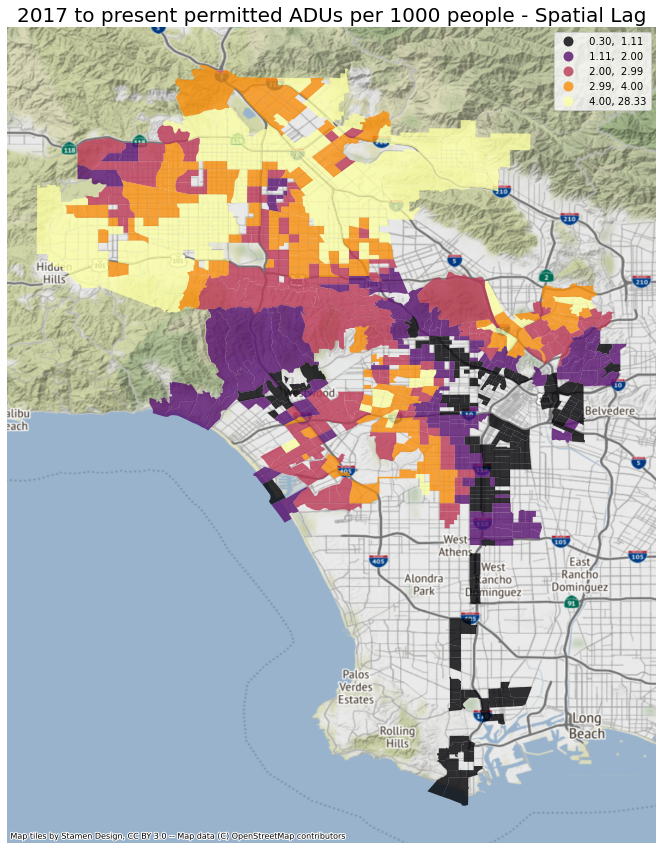

In [84]:
# use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
gdf_2.plot(ax=ax,
         figsize=(15,15),
         column='permits_per_1000_lag',
         legend=True,
         alpha=0.8,
         cmap='inferno',
         scheme='quantiles')

ax.axis('off')
ax.set_title('2017 to present permitted ADUs per 1000 people - Spatial Lag',fontsize=20)

ctx.add_basemap(ax,crs=gdf.crs.to_string())

Compared to our previous map, "2017 to present permitted ADUs per 1000 people," this map accounts for the spatial lag and the spatial clusters of permit activity become much clearer. We see some isolated clusters of significant activity that appear to be occurring in LA's Mid-City area, Eagle Rock and parts of the city that are just east of Inglewood or just west of Glendale. However, most of the activity appears to be concentrated throughout the San Fernando Valley. 

This contrast between the two maps can be seen more clearly in a side-by-side comparison below.

## Side-by-side maps

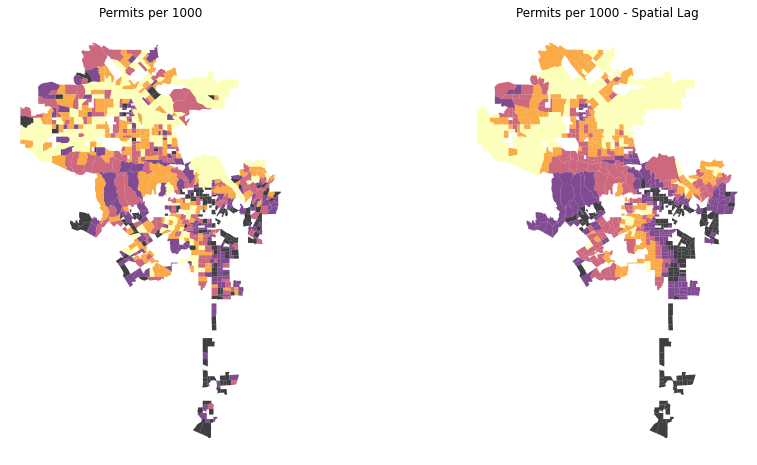

In [85]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
gdf_2.plot(ax=ax[0], # this assigns the map to the left subplot
         column='permits_per_1000', 
         cmap='inferno', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Permits per 1000")

# spatial lag map on the right
gdf_2.plot(ax=ax[1], # this assigns the map to the right subplot
         column='permits_per_1000_lag', 
         cmap='inferno', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Permits per 1000 - Spatial Lag")

plt.show()

## Interactive spatial lag satellite map

Now we will attempt to plot the spatial lag column of the dataset on an interactive satellite map, so we can better contextualize where these spatial clusters are occurring in the city of LA. By zooming in, we can confirm exactly where these clusters are happening, rather than just guessing "west of Glendale" like we did previously.

In [86]:
# interactive version needs to be in WGS84
gdf_2_web = gdf_2.to_crs('EPSG:4326')

In [87]:
# what's the centroid? (center lat, center long)
minx, miny, maxx, maxy = gdf_2_web.geometry.total_bounds
center_lat_gdf_2_web = (maxy-miny)/2+miny
center_lon_gdf_2_web = (maxx-minx)/2+minx

In [88]:
# some stats
gdf_2_web.permits_per_1000_lag.describe()

count    815.000000
mean       2.727261
std        1.909338
min        0.302644
25%        1.285729
50%        2.518683
75%        3.654635
max       28.327696
Name: permits_per_1000_lag, dtype: float64

In [89]:
# grab the median
median = gdf_2_web.permits_per_1000_lag.median()

In [90]:
#this is complex, so Yoh is available to meet in OH if we want to pursue something like this map

fig_10 = px.choropleth_mapbox(gdf_2_web, 
                     geojson=gdf_2_web.geometry, # the geometry column
                     locations=gdf_2_web.index, # the index
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     color='permits_per_1000_lag',
                     color_continuous_scale='inferno',
                     color_continuous_midpoint =median, # put the median as the midpoint
                     range_color =(0,median*2),
                     hover_data=['permits_count','permits_per_1000','permits_per_1000_lag'],
                     center = {"lat": center_lat_gdf_2_web, "lon": center_lon_gdf_2_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'permits_per_1000_lag':'Permits per 1000 (Spatial Lag)',
                             'permits_per_1000':'Permits per 1000',
                     })
fig_10.update_traces(marker_line_width=0.1, marker_line_color='white')
fig_10.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [91]:
fig_10.write_html("Final_spatial_join_fill_by_permitper1000_dynamic_basemap_spatial_lag.html")

Great! The zoom and pan features are very helpful and provide a lot more context. For example, looking at the cluster "just east of Inglewood," we can zoom to see that the specific neighborhoods these tracts sit within are Hyde Park and the northern edge of Morningside Park.  



## Moran's Plot

We now want to quantify the degree of the spatial correlation. We'll start by calculating the Moran's I value below.

In [92]:
y = gdf_2.permits_per_1000
moran = Moran(y, wq)
moran.I

0.04701339961456352

From lab, we know that the Moran's I value is essentially the value of the slope of the scatterplot of our "permits per 1000" and "permits per 1000 spatial lag" columns. It indicates whether or not we have a positive or negative autocorrelation. Our value was calculated to be roughly 0.05.

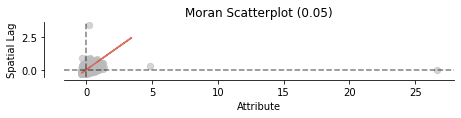

In [93]:
#MOrans I value is the slope - red line going through
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

Because the line shows a positive slope, this indicates that either high values are close to high values and/or low values are close to low values. What does this all mean, though? What we're trying to determine is how likely it is that the clusters we are seeing are occurring due to random chance. 

This process randomizes our census tracts 999 times. We then can determine whether we can reject the hypothesis that our current distribution of data is random. 

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.



(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f6729a238b0>)

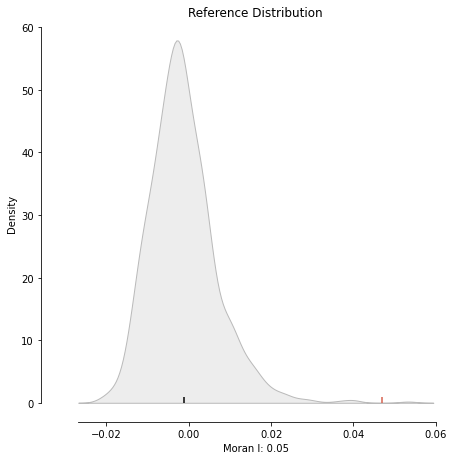

In [94]:
plot_moran_simulation(moran,aspect_equal=False)

The simulation we ran produced the graph above. The red dot indicates our Moran's I value (0.04701). The accompanying distribution represents the possibility of 999 permutations of randomization. Our Moran's I value is relatively far away from this distribution, but nowhere near as far as the value was during lab. It's difficult for me to confidently say if we are outside of the realm of possibility that this is "occurring by chance." Funny to be doing this course while also learning stats for the first time.. 

Let's calculate the p-value and compare this to our alpha (0.05) to see if we can reject the null hypothesis. We'll calculate the Moran's p-value below.

In [95]:
moran.p_sim

0.002

The p-value calculated was 0.004. From this, we know that there is a 0.4% chance that our findings occurred randomly. Since the alpha value is typically 0.05 and our p-value is well below this value, we can reject the null hypothesis that the map is random. In other words, we conclude that the map displays more spatial pattern than expected if the values had been randomly allocated to a location.

After revisting the lab recording, I hope am understanding this correctly...

## Local Spatial Autocorrelation & Moran Local Scatterplot

In the previous cells, we determined that there is a positive spatial autocorrelation and that this is not occurring at random in a global sense. We'll conduct a local spatial autocorrelation to determine exactly where these clusters are happening. To do so, we'll use "Local Indicators of Spatial Assocation (LISA)". This tool classifies areas into the following four groups: 

- HH: high permit rate geographies near other high permit rate neighbors 
- LL: low permit rate geographies near other low permit rate neighbors 
- LH (donuts): low permit rate geographies surrounded by high permit rate neighbors
- HL (diamonds): high permit rate geographies surrounded by low permit rate neighbors

In [96]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

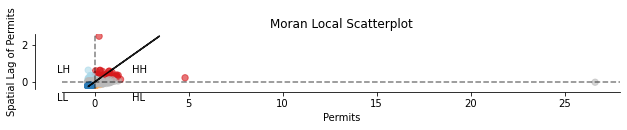

In [97]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Permits")
ax.set_ylabel('Spatial Lag of Permits')

# add some labels
plt.text(2, 0.5, "HH", fontsize=10)
plt.text(2, -1, "HL", fontsize=10)
plt.text(-2, .5, "LH", fontsize=10)
plt.text(-2, -1, "LL", fontsize=10)
plt.show()

This scatterplot is very similar to the one we were looking at in 4.7 Moran's Plot. The permits are along the x-axis and the spatial lag of permits are along the y-axis. However, now it assigns colors to the four categories: HH (red), LL (blue), LH (light blue), and HL (yellow). We've assigned the pvalue to be 0.05, so we know that the colored census tracts are statistically significant at a pvalue of 0.05. 

## Spatial Autocorrelation Map

We will now map the information we displayed above in our Moran Local Scatterplot.

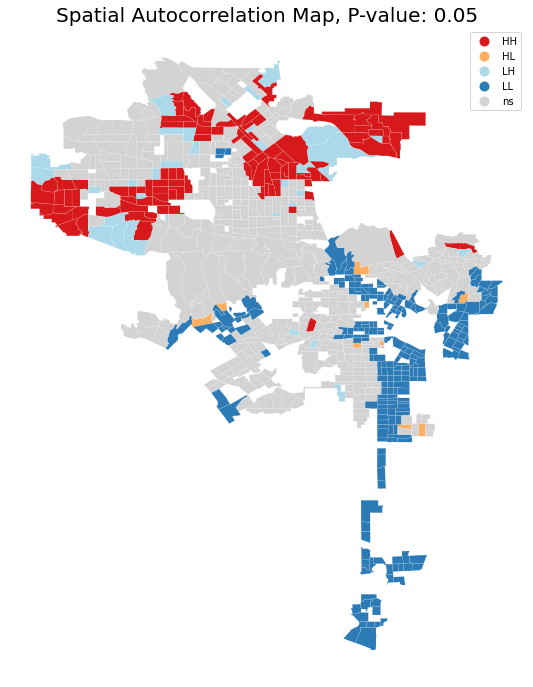

In [98]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, gdf_2, p=0.05, ax=ax)
ax.set_title('Spatial Autocorrelation Map, P-value: 0.05',fontsize=20)
plt.show()

This is interesting because some of the tracts that had a red fill in our earlier maps have switched to a light blue. For example, if we look at the census tracts east of Inglewood in Hyde Park / Morningside Park, these now have light blue fills, which indicates that they are "LH," or low permit rate geographies surrounded by high permit rate neighbors (donuts). 

Lastly, we'll do a side-by-side map looking at different p-values. The left map will include a p-value of 0.05. The right map will include a lower p-value of 0.01, which will show clusters of permit activity with even higher statistical significance. 

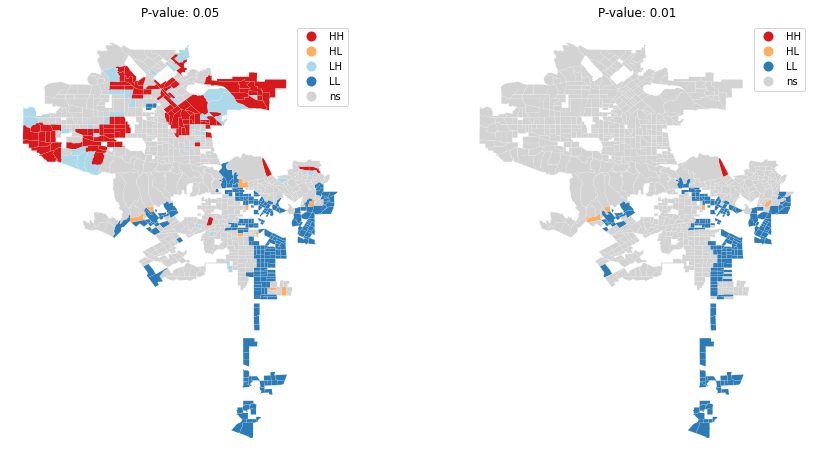

In [99]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# regular count map on the left
lisa_cluster(lisa, gdf_2, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa, gdf_2, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

This has been an interesting exercise. It's helpful to be able to pinpoint statistically significant clusters of activity in the city and analyze them through our four categories: HH, HL, LH and LL. Regarding next steps, it's likely that we will want to take a closer look at these census tracts' household median incomes and see if we are noticing any patterns. 

# Scatter Plot and Side-by-Side Map

Our code from Group Assignments 3 and 4 accomplish the bulk of the analysis we intended to do for this project. There are two loose ends, though, which we will tie up here. First, we want to create a scatter plot comparing neighborhood income to the number of ADUs permitted per capita in that neighborhood. Our hope is that this plot will reveal trends about the relationship between these two variables. Then, we will create a side-by-side map showing both variables at the same time.

## Scatter Plot

As discussed above, here we create a scatter  plot comparing neighborhood income to the number of ADUs permitted per capita in that neighborhood.

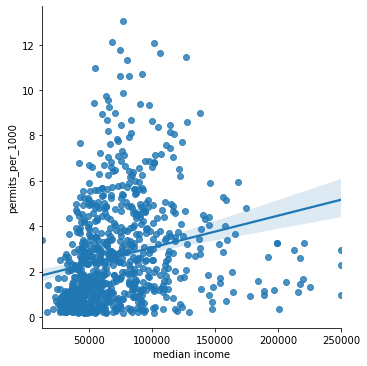

In [100]:
import seaborn as sns
sns.lmplot(x='median income',y='permits_per_1000',data=gdf_2,fit_reg=True) 

Interesting! This seems to contradict our research hypothesis! This shows that neighborhood income is positively correlated with permitted ADUs, not negatively, as we predicted! To vizualize the data a bit more clearly, I'll create a bar chart with the average ADUs permitted based on median income bracket. 

In [101]:
gdf_2['incomebin'] = np.where(gdf_2['median income']<25000, '0-25000', 'Over 250000')
gdf_2.head()

conditions = [
    (gdf_2['median income'] < 25000),
    (gdf_2['median income'] >= 25000) & (gdf_2['median income'] < 50000),
    (gdf_2['median income'] >= 50000) & (gdf_2['median income'] < 75000),
    (gdf_2['median income'] >= 75000) & (gdf_2['median income'] < 100000),
    (gdf_2['median income'] >= 100000) & (gdf_2['median income'] < 125000),
    (gdf_2['median income'] >= 125000) & (gdf_2['median income'] < 150000),
    (gdf_2['median income'] >= 150000) & (gdf_2['median income'] < 175000),
    (gdf_2['median income'] >= 175000) & (gdf_2['median income'] < 200000)]

choices = ['0-25k','25k-50k','50k-75k','75k-100k','100k-125k','125k-150k','150k-175k','175k-200k']
gdf_2['incomebin'] = np.select(conditions, choices, default='200000k+')
gdf_2.head()

,geoid,name,median income,error,geometry,population,poperror,permits_count,permits_per_1000,permits_per_1000_lag,permit_lag_diff,incomebin
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",63534.0,16806.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",4283.0,443.0,21,4.903105,9.193186,-4.290081,50k-75k
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",90389.0,9796.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",3405.0,334.0,17,4.992658,9.357215,-4.364557,75k-100k
2,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",44083.0,9483.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",6347.0,484.0,2,0.315110,9.425765,-9.110656,25k-50k
3,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",43713.0,4639.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",3702.0,276.0,12,3.241491,9.059968,-5.818477,25k-50k
4,14000US06037101300,"Census Tract 1013, Los Angeles, CA",81776.0,11857.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",3884.0,394.0,23,5.921730,8.724938,-2.803208,75k-100k


In [102]:
bin1 = gdf_2[gdf_2['incomebin']=='0-25k']
bin2 = gdf_2[gdf_2['incomebin']=='25k-50k']
bin3 = gdf_2[gdf_2['incomebin']=='50k-75k']
bin4 = gdf_2[gdf_2['incomebin']=='75k-100k']
bin5 = gdf_2[gdf_2['incomebin']=='100k-125k']
bin6 = gdf_2[gdf_2['incomebin']=='125k-150k']
bin7 = gdf_2[gdf_2['incomebin']=='150k-175k']
bin8 = gdf_2[gdf_2['incomebin']=='175k-200k']
bin9 = gdf_2[gdf_2['incomebin']=='200000k+']

In [103]:
bin1mean = bin1['permits_per_1000'].mean()
bin2mean = bin2['permits_per_1000'].mean()
bin3mean = bin3['permits_per_1000'].mean()
bin4mean = bin4['permits_per_1000'].mean()
bin5mean = bin5['permits_per_1000'].mean()
bin6mean = bin6['permits_per_1000'].mean()
bin7mean = bin7['permits_per_1000'].mean()
bin8mean = bin8['permits_per_1000'].mean()
bin9mean = bin9['permits_per_1000'].mean()

In [104]:
bin1['xp'] = bin1['permits_per_1000']*bin1['population']
bin1mean = sum(bin1['xp'])/sum(bin1['population'])
bin2['xp'] = bin2['permits_per_1000']*bin2['population']
bin2mean = sum(bin2['xp'])/sum(bin2['population'])
bin3['xp'] = bin3['permits_per_1000']*bin3['population']
bin3mean = sum(bin3['xp'])/sum(bin3['population'])
bin4['xp'] = bin4['permits_per_1000']*bin4['population']
bin4mean = sum(bin4['xp'])/sum(bin4['population'])
bin5['xp'] = bin5['permits_per_1000']*bin5['population']
bin5mean = sum(bin5['xp'])/sum(bin5['population'])
bin6['xp'] = bin6['permits_per_1000']*bin6['population']
bin6mean = sum(bin6['xp'])/sum(bin6['population'])
bin7['xp'] = bin7['permits_per_1000']*bin7['population']
bin7mean = sum(bin7['xp'])/sum(bin7['population'])
bin8['xp'] = bin8['permits_per_1000']*bin8['population']
bin8mean = sum(bin8['xp'])/sum(bin8['population'])
bin9['xp'] = bin9['permits_per_1000']*bin9['population']
bin9mean = sum(bin9['xp'])/sum(bin9['population'])

/opt/conda/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [105]:
binmeans = [bin1mean, bin2mean, bin3mean, bin4mean, bin5mean, bin6mean, bin7mean, bin8mean, bin9mean]
binmeans

[0.9830908375933937,
 1.5417134892403275,
 2.925773041929325,
 3.536397919868869,
 3.6632573213209887,
 3.7371874938043974,
 3.0944563945809276,
 1.7469079728879882,
 1.8176034897987003]

In [106]:
data = {'Income Bin':[choices], 
        'ADUs Permitted Per Capita':[binmeans]} 
incomebins2 = pd.DataFrame(data)
incomebins2


data = [['0-25k', bin1mean], ['25k-50k', bin1mean], ['50k-75k', bin3mean],['75k-100k', bin4mean], 
       ['100k-125k', bin5mean], ['125k-150k', bin6mean],['150k-175k', bin7mean], 
       ['175k-200k', bin8mean], ['200000k+', bin9mean]] 
  
incomebins2 = pd.DataFrame(data, columns = ['Income Bin', 'ADUs Permitted Per 1,000 People']) 

incomebins2

,Income Bin,"ADUs Permitted Per 1,000 People"
0,0-25k,0.983091
1,25k-50k,0.983091
2,50k-75k,2.925773
3,75k-100k,3.536398
4,100k-125k,3.663257
5,125k-150k,3.737187
6,150k-175k,3.094456
7,175k-200k,1.746908
8,200000k+,1.817603


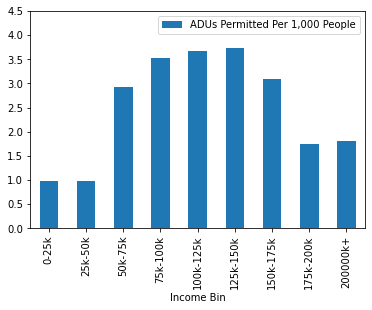

In [107]:
incomebins2.plot.bar(x='Income Bin', y='ADUs Permitted Per 1,000 People',ylim=[0,4.5])

This data shows that low-income (under 50k) and high income (over 175k) neighborhoods do not create as many ADUs as those between those values on a per capita basis. Now we move on to mapping the data. We'll create a side-by-side map that show median income and permmited ADUs per 1000 people, respectively.

Text(0.5, 1.0, 'ADUs Permitted Per 1,000 People')

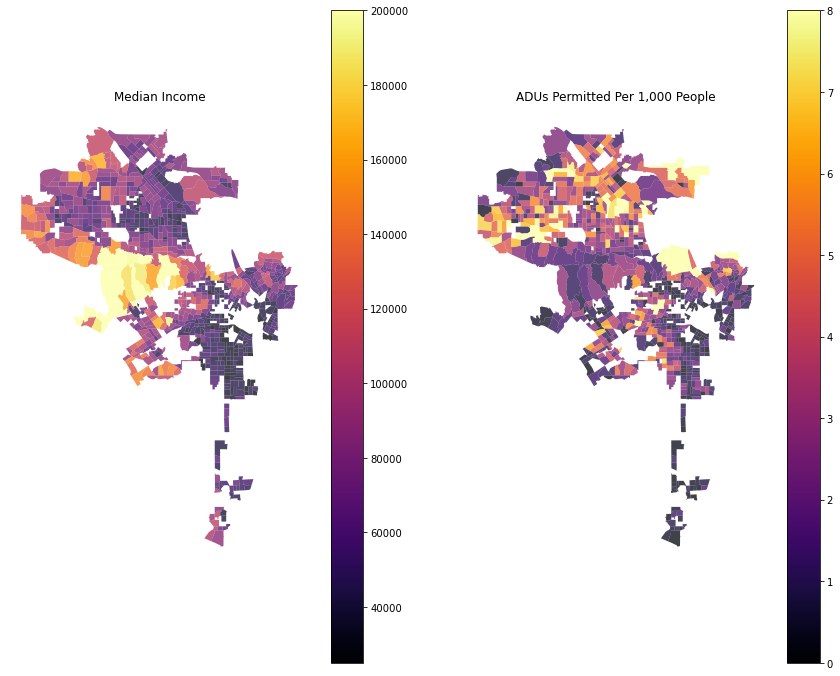

In [108]:
# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 12))

# name each subplot
ax1, ax2 = axs

# regular count map on the left
gdf_2.plot(column='median income', 
            cmap='inferno', 
            vmin = 25000, vmax = 200000,
#            scheme='quantiles',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax1, # this assigns the map to the subplot,
            legend=True
           )

ax1.axis("off")
ax1.set_title("Median Income")

# spatial lag map on the right
gdf_2.plot(column='permits_per_1000', 
            cmap='inferno', 
            vmin = 0, vmax = 8,
#            scheme='quantiles',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax2, # this assigns the map to the subplot
            legend=True
           )

ax2.axis("off")
ax2.set_title("ADUs Permitted Per 1,000 People")